# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


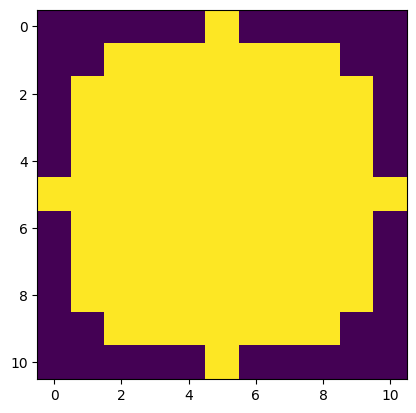

In [2]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]]


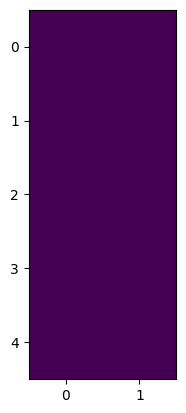

In [3]:
def line_strell(width,length):
  if student :
    strell = morpho.rectangle(length,width)
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

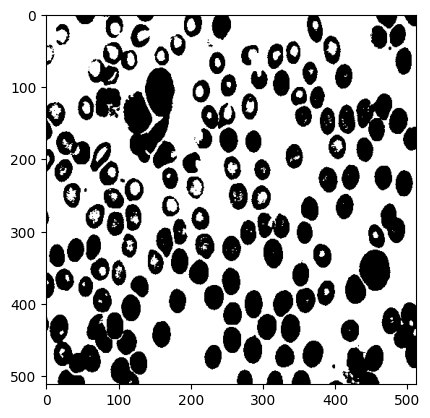

In [30]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("G:\Mon Drive\\2A\IMA\IMA201\Tp\images\cell.tif")
  # Theresholding and display
  img = img > 150
  plt.imshow(img, cmap='gray')

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

In [41]:
img = skio.imread("G:\Mon Drive\\2A\IMA\IMA201\Tp\images\\cell.tif")

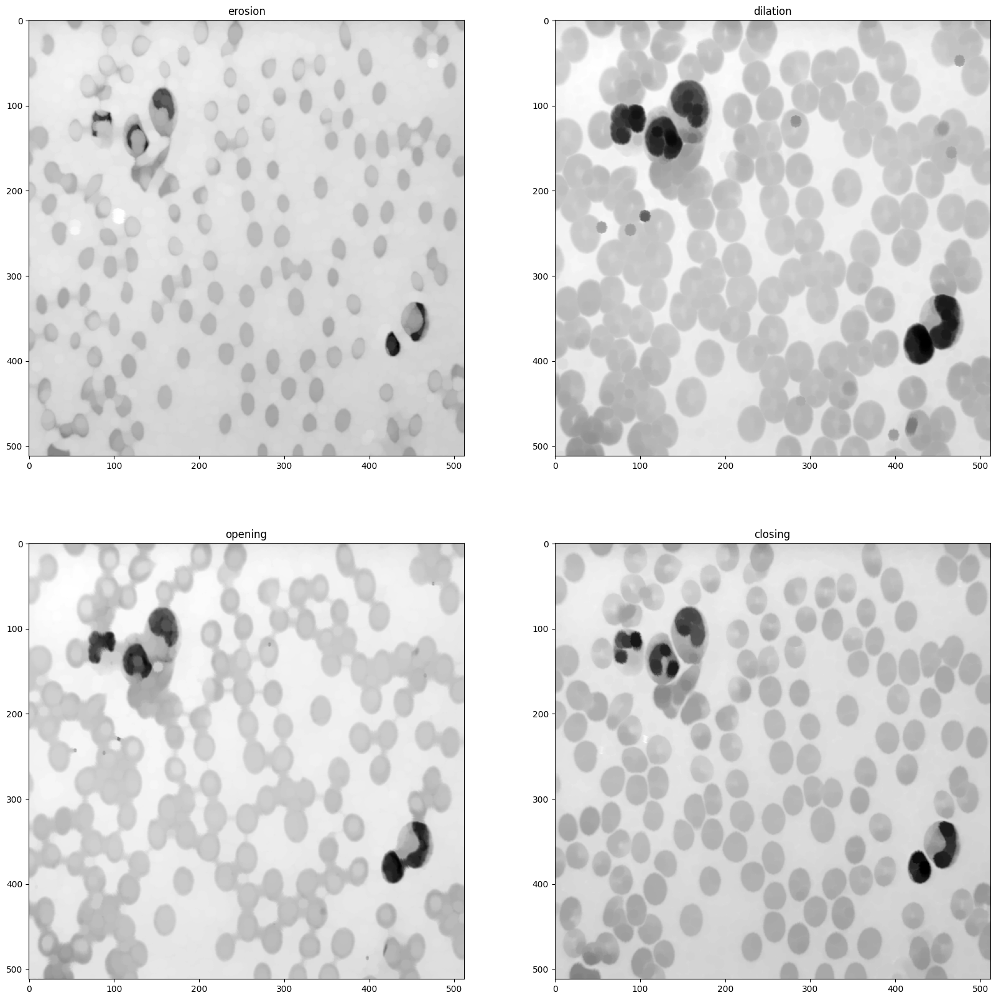

In [42]:
strell = morpho.disk(5)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
imgs = [morpho.dilation(img,strell),morpho.erosion(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
if not student :
  octa=morpho.disk(5)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.dilation(img,octa),morpho.erosion(img,octa),morpho.opening(img,octa),morpho.closing(img, octa)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The shape of the structuring element select shape in the image that fit the structuring element 
- **Q** : What is the influence of the size of the structuring element ?
- **A** : the size of the structuring element select the size of object to keep visible.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


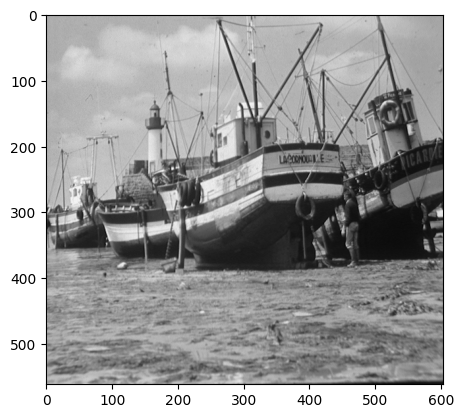

In [25]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("G:\Mon Drive\\2A\IMA\IMA201\Tp\images\\bat.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

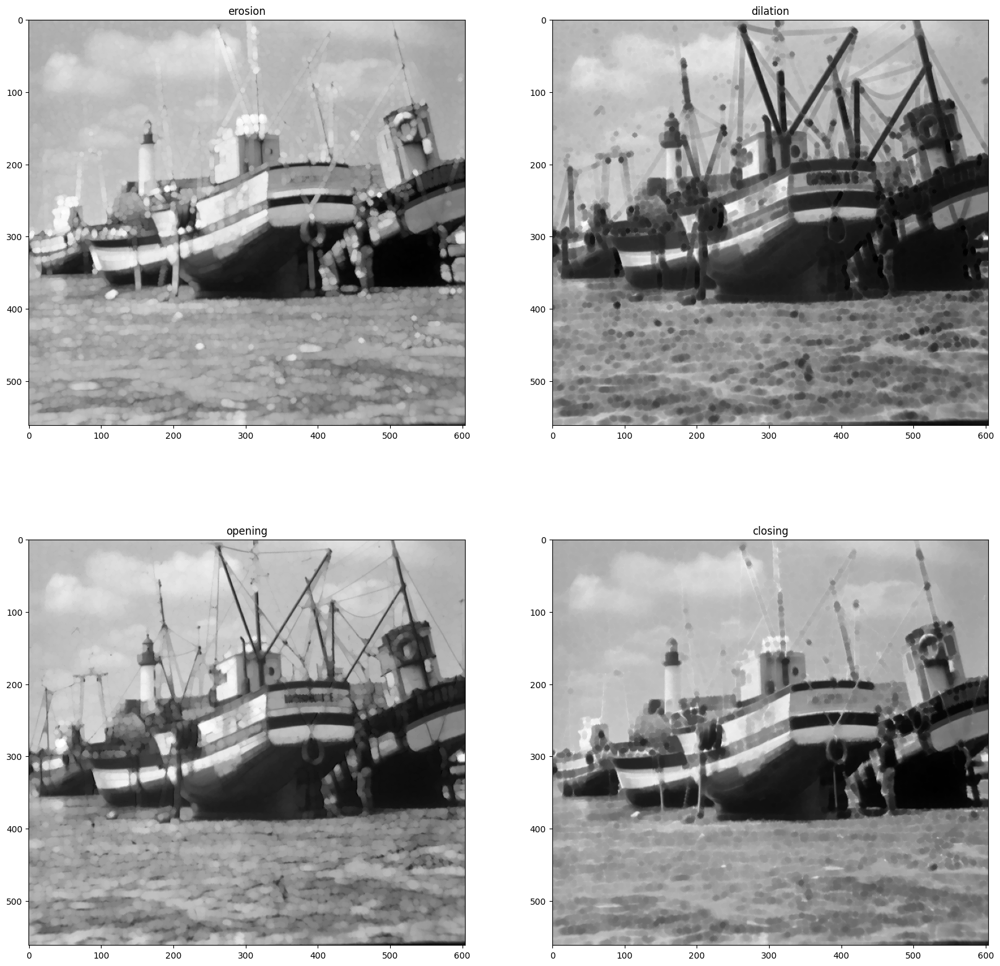

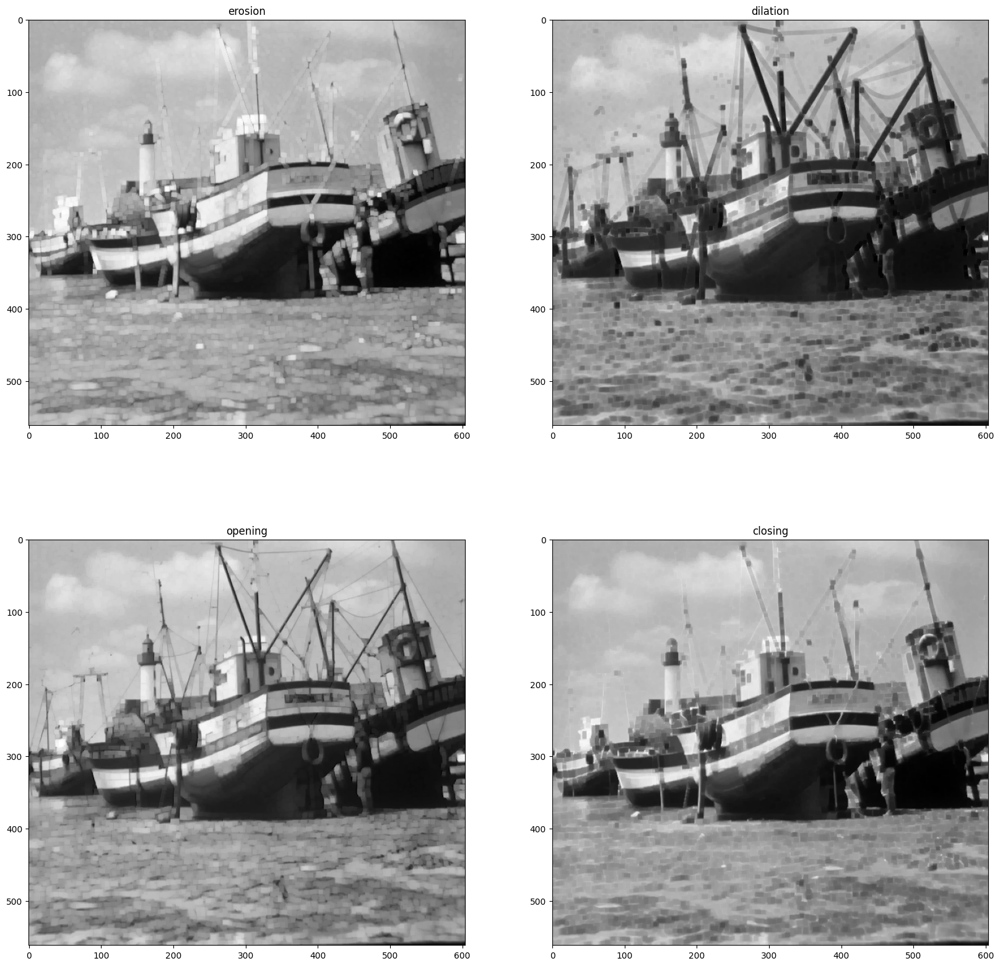

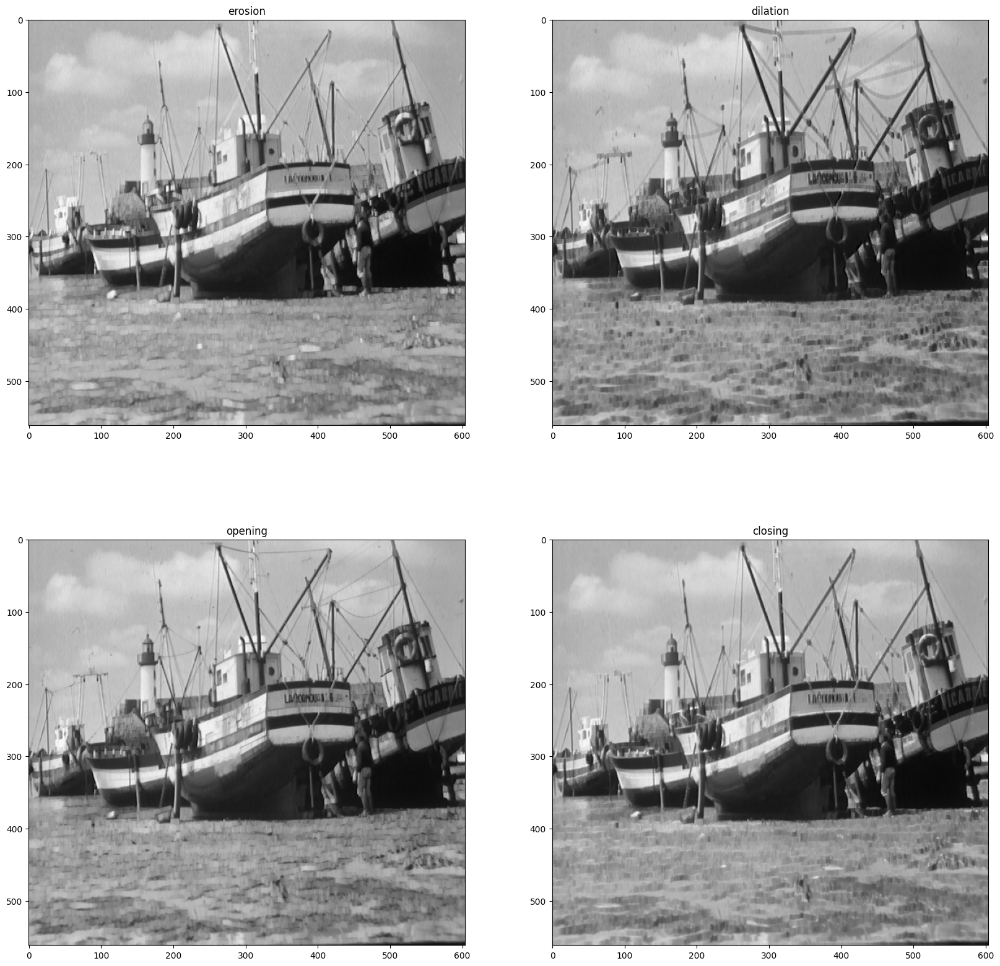

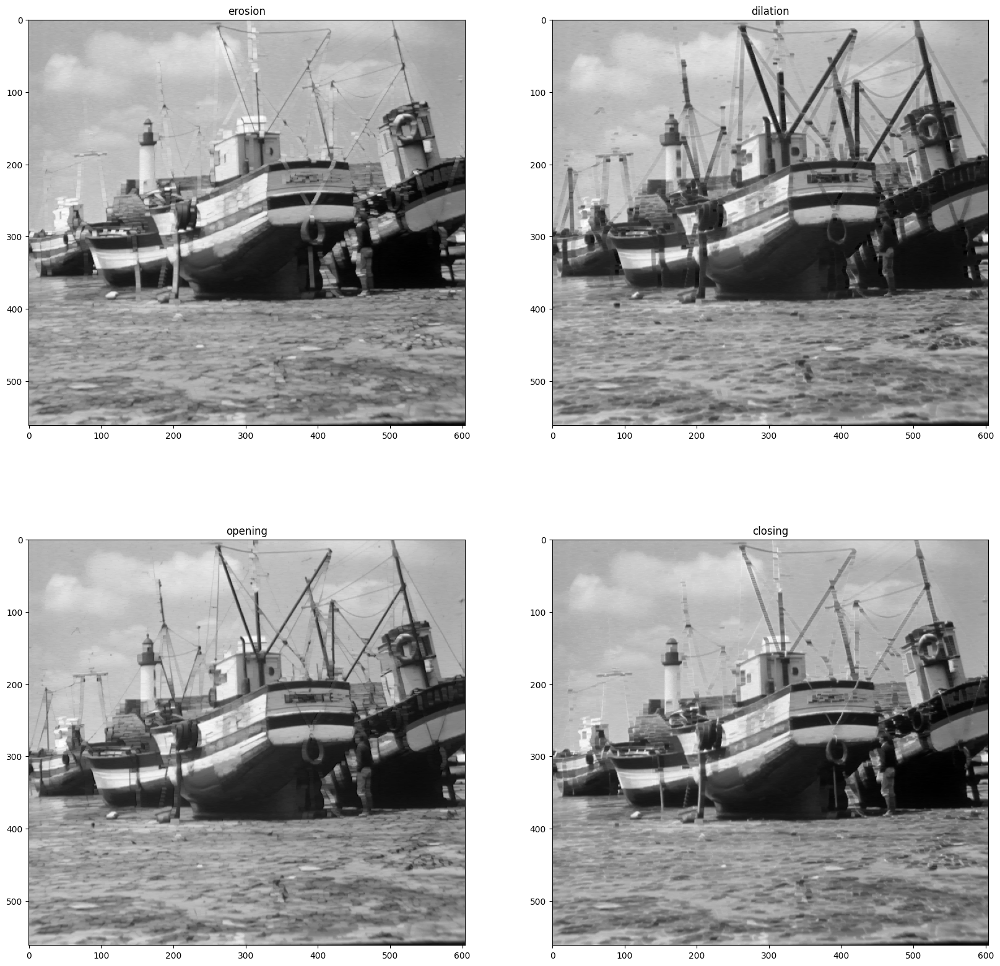

In [26]:
if student:
  strell=[morpho.disk(3),morpho.rectangle(5,5),morpho.rectangle(5,1),morpho.rectangle(1,5)]
  #strell= [morpho.disk(2),morpho.disk(3),morpho.disk(5),morpho.disk(10)]
  for k in range(4):
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.dilation(img,strell[k]),morpho.erosion(img,strell[k]),morpho.opening(img,strell[k]),morpho.closing(img,strell[k])]# Add in this list the 4 images, obtained with the for operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()


- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : same answer as above

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : The result is not the same because as we can see  in the program below a disk of size 5 is different from a disk of syze 2 * a disk of size 3

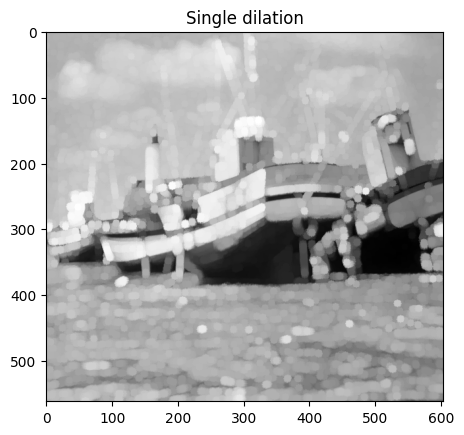

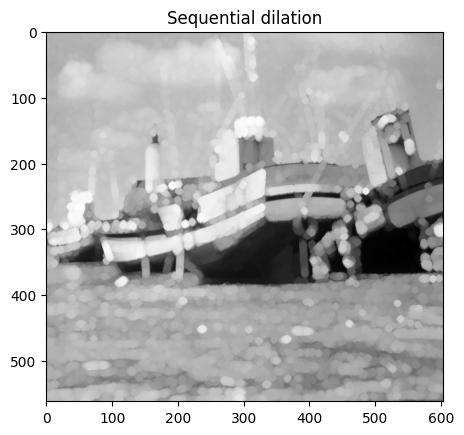

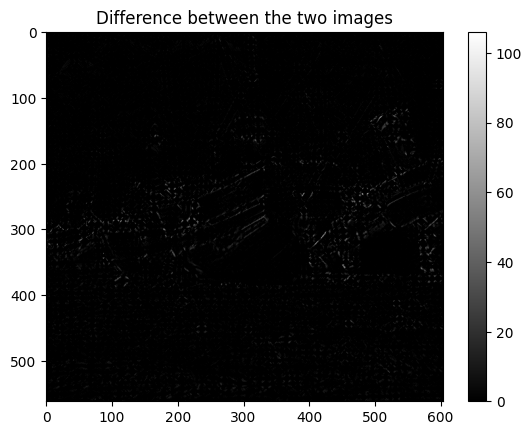

247761


In [8]:
if student:
  ### start code
  dilation = morpho.dilation(img,morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** Plot the result of a dilation by a disk structuring element of size 2 followed by
a dilation by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** ...

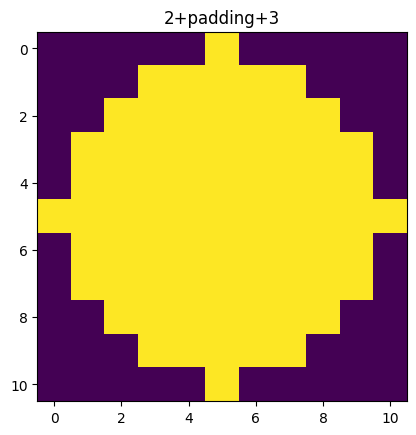

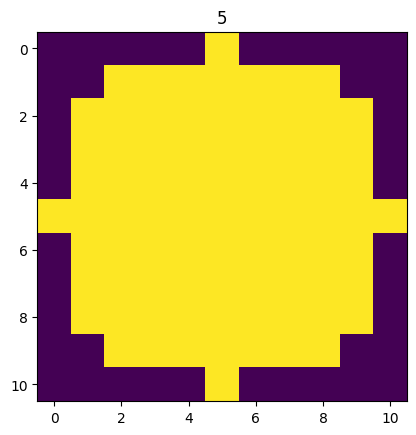

In [28]:
strell = morpho.disk(2)
sqr_strell=np.pad(strell, 3, 'constant', constant_values=0)

sqr_strell = morpho.dilation(sqr_strell,morpho.disk(3))
plt.imshow(sqr_strell)
plt.title("2+padding+3")
plt.show()

plt.imshow(morpho.disk(5))
plt.title("5")
plt.show()



[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


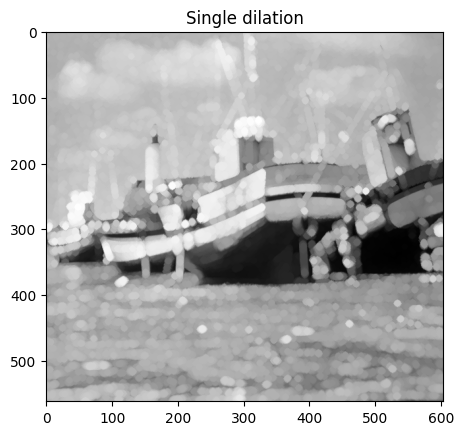

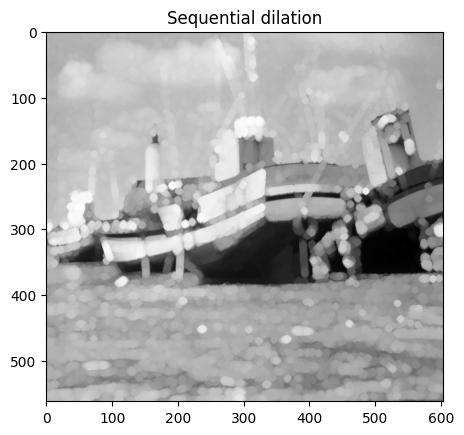

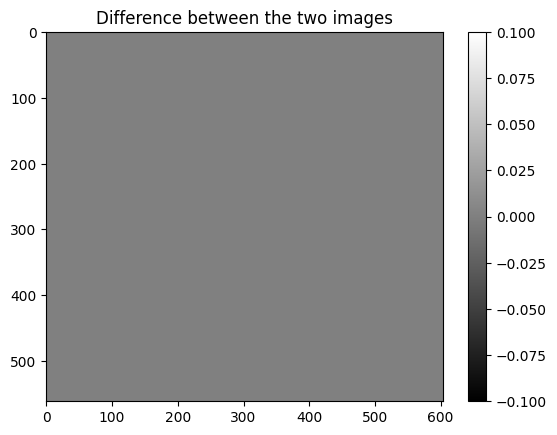

0


In [10]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell, 3, 'constant', constant_values=0)
  sqr_strell = morpho.dilation(sqr_strell,morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img,sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


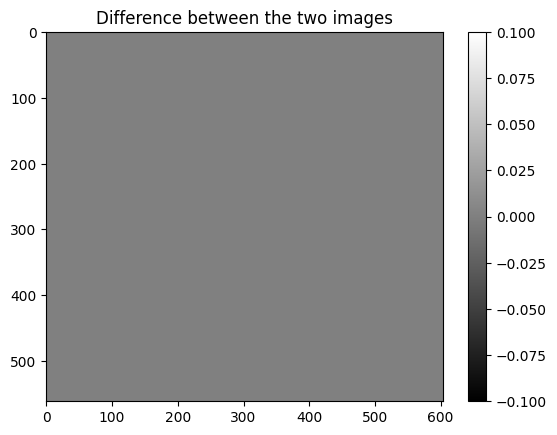

0


In [11]:
if student :
  ### start code
  strell= morpho.disk(3)
  # first closing 
  closing = morpho.closing(img,strell)
  # second closing
  closing2 = morpho.closing(closing,strell)
  
  plt.imshow(closing-closing2,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(closing-closing2)))

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : On ne récupére que les détails, ou structures qui sont lumineuses dans l'image

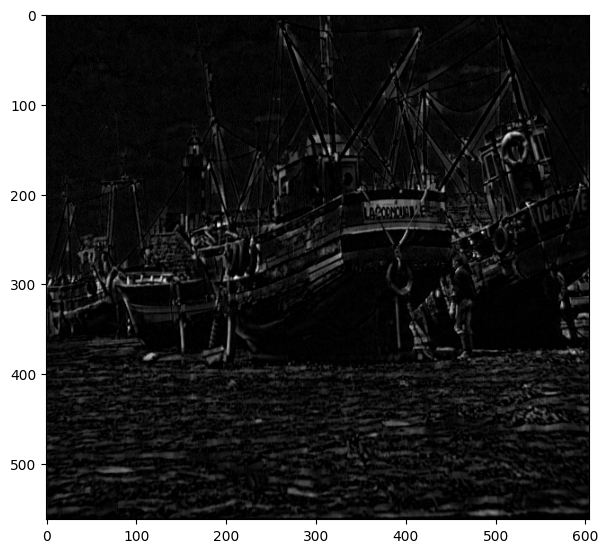

In [12]:
# pretty boat
#if student:
#   ### start code
#   strell = morpho.diamond(5)
#   top_hat = img - morpho.opening(img,strell)
# plt.figure(figsize = (7,7))
# plt.imshow(top_hat,cmap = "gray")
# plt.show()

if student:
  ### start code
  strell = morpho.rectangle(10,5)
  top_hat = img - morpho.opening(img,strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : On ne récupére que les détails, ou structures qui sont sombres dans l'image comme les mats ou le nom du bateau

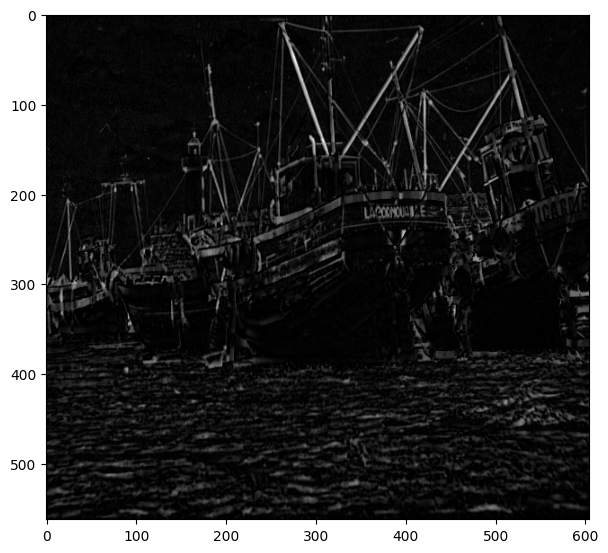

In [13]:
if student:
  ### start code
  strell = morpho.rectangle(10,5)
  dual_top_hat = morpho.closing(img,strell) - img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: On filtre petit à petit les formes de tailles croissantes dans l'image

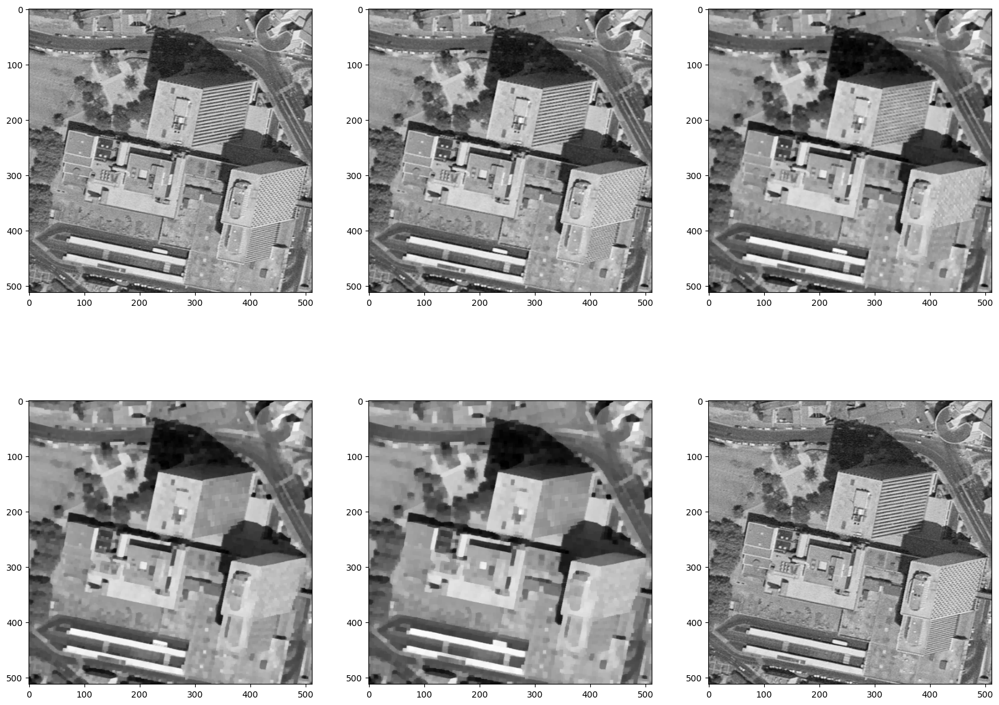

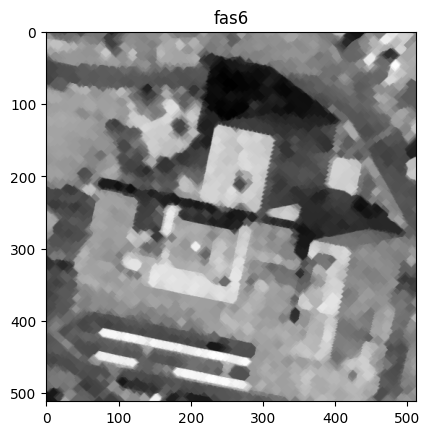

In [14]:
# Example
img = skio.imread("G:\Mon Drive\\2A\IMA\IMA201\Tp\images\montreuil.tif")

# Structuring elements
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)

# Images
fas1=morpho.closing(morpho.opening(img, se1),se1)
fas2=morpho.closing(morpho.opening(fas1, se2),se2)
fas3=morpho.closing(morpho.opening(fas2, se3),se3)
fas4=morpho.closing(morpho.opening(fas3, se4),se4)
fas5=morpho.closing(morpho.opening(fas4, se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
  se6=morpho.opening(img, morpho.diamond(5))
  fas6=morpho.closing(se6, morpho.diamond(5)) 
  plt.imshow(fas6,cmap = "gray")
  plt.title("fas6")
  plt.show()
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: We clearly distinguish the cells and even more the nucleus of those cells.

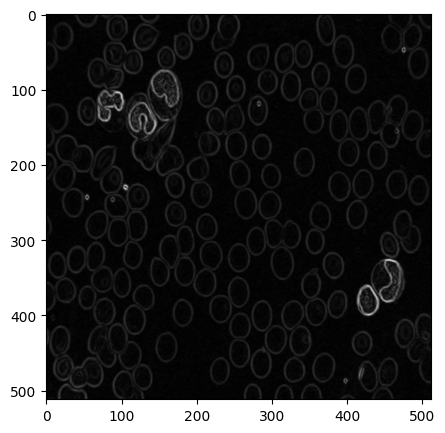

In [15]:
if student : 
  img = skio.imread("G:\Mon Drive\\2A\IMA\IMA201\Tp\images\/cell.tif")
  morpho_grad = morpho.dilation(img,morpho.disk(1))-morpho.erosion(img,morpho.disk(1))
plt.figure(figsize=(5,5))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : It is difficult to find a threshhold that suppress the inside of some cells because those inside is brighter than the edges of the cells

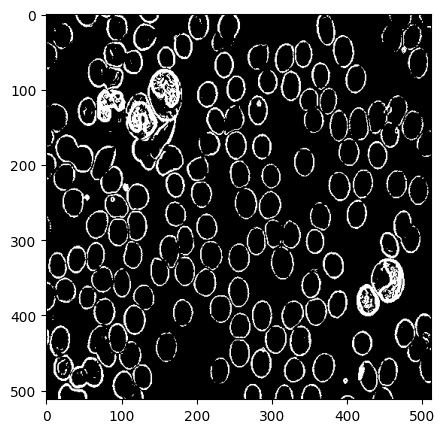

In [16]:
if student :
  thresh_grad = morpho_grad > 10
plt.figure(figsize=(5,5))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using seg.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** : we can see many region the segmentation of the image.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :k defines the number of region which are segmented.

The underlying problem is that we must increase k to recognize the image but when we increase k, some region that shouldn't be segmented are segmented. 

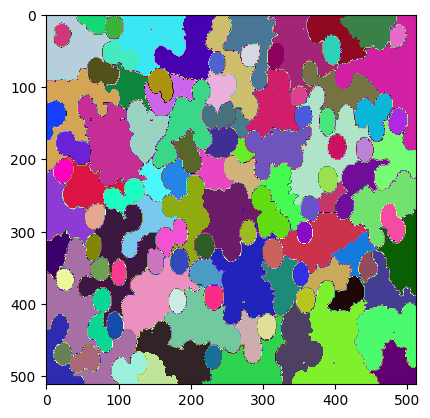

In [17]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  k=150
  wat = seg.watershed(morpho_grad, k)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : La fermeture permet de supprimer des structures lumineuses donc on segmente mieux les zones sombres
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : A contrario, faire l'ouverture permet de segmenter plus efficacement les structures lumineuses.

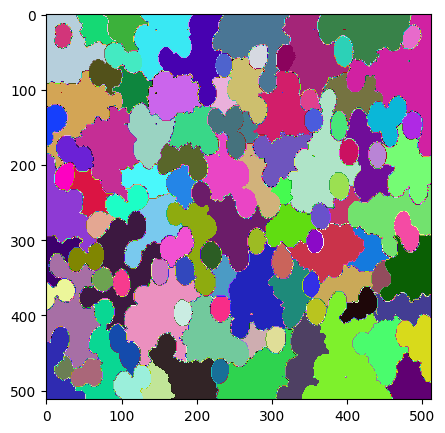

In [18]:
if student :
  wat_closing = morpho.closing(morpho_grad,morpho.disk(1))
  wat_closing = seg.watershed(wat_closing, k)
plt.figure(figsize =(5,5))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()


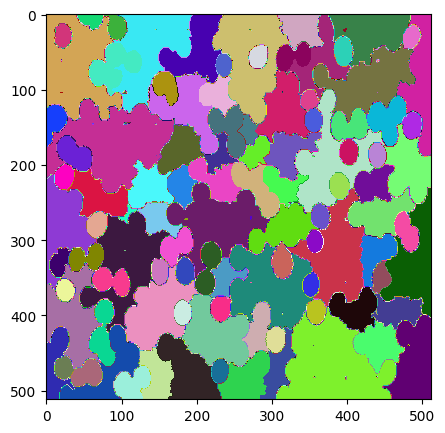

In [19]:
if student :
  wat_opening = morpho.opening(morpho_grad,morpho.disk(1))
  wat_opening = seg.watershed(wat_opening, k)
plt.figure(figsize =(5,5))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : We can observe different kind of cells with the one having a nucleus in white. 

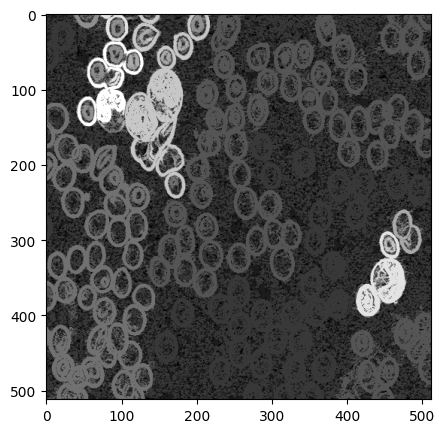

In [20]:
imOpen = morpho.opening(morpho_grad,morpho.disk(5))
reco= morpho.reconstruction(imOpen, morpho_grad)
plt.figure(figsize =(5,5))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : the color is not the same but the cells with a nucleus are a lot more visible and we also see the other cells so it helps segment the cells

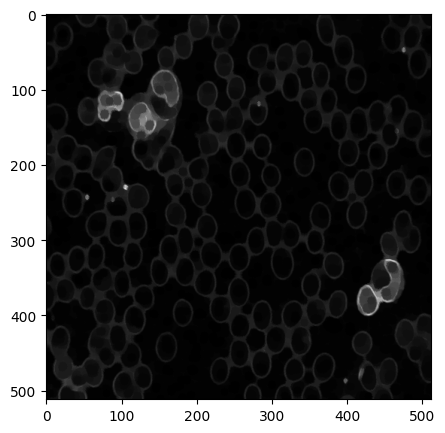

In [21]:
imClos = morpho.closing(morpho_grad,morpho.disk(5))
reco=morpho.reconstruction(morpho_grad, imClos)
plt.figure(figsize =(5,5))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

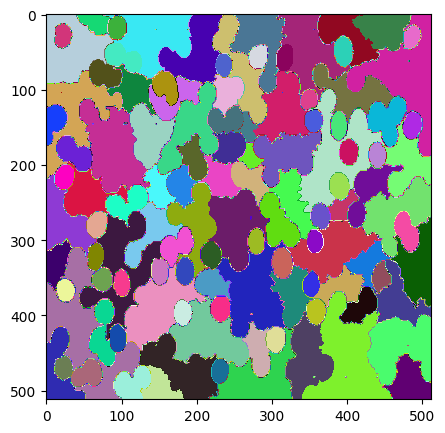

In [23]:
plt.figure(figsize =(5,5))
plt.imshow(wat,cmap =cmaprand)
plt.show()